# **MVP de Análise de Dados sobre Depressão Estudantil**
## **PUC Rio**

## 1. Objetivo Principal
Desenvolver um MVP de análise de dados para mostrar dados sobre depressão nos indivíduos, com base no dataset escolhido, com foco no indicadores:

- Demográficos: gênero, cidade, profissão, idade
- Acadêmicos: CGPA, pressão acadêmica, satisfação com estudos
- Profissionais: pressão no trabalho, satisfação no trabalho
- Saúde: hábitos alimentares(dietéticos), duração do sono
- Mental: depressão, histórico familiar, pensamentos suicidas



##2. Perguntas-Chave de Negócio 
- 1- Quantidade de pessoas com problemas de depressao por gênero 
- 2- Quantidade de pessoas com problemas de depressao por região 
- 3- Quantidade de pessoas com problemas de depressao que só estudam, só trabalham e ambos
- 4- Quantidade de pessoas com problemas de depressao por profissao
- 5- Quantidade de pessoas com problemas de depressao que dormem pouco
- 6- Quantidade de pessoas com problemas de depressao com problemas historicos mentais na familia
- 7- Quantidade de pessoas com problemas de depressao que tenham pensamentos suicidas
- 8- Relacao entre problema de depressao com o atingimento de metas (boas notas - CGPA)


## 2- DataBase

In [0]:
# Criar database para cada camada
spark.sql("CREATE DATABASE IF NOT EXISTS bronze_layer")
spark.sql("CREATE DATABASE IF NOT EXISTS silver_layer") 
spark.sql("CREATE DATABASE IF NOT EXISTS gold_layer")


DataFrame[]

## 3- Camada Bronze

In [0]:
import pandas as pd
from pyspark.sql import SparkSession

bronze_layer_df = pd.read_csv(
   'https://raw.githubusercontent.com/bcmarcondes/MVP_StudentDepressionDS/main/student_depression_dataset.csv',
    sep=',',                ## Define o separador de colunas
    encoding='latin-1',     ## Geralmente UTF-8, é bom especificar
    skip_blank_lines=True,  ## Ignora linhas sem dados
    on_bad_lines='skip'     ## Ignora linhas com erros
)
print("Camada Bronze OK!")

# Salvar na camada bronze
bronze_layer_df.to_parquet("dados.parquet", index=False)

Camada Bronze OK!


**_Dicionário/Catálogo_**

- ID: Identificador único para cada indivíduo que aceitou participar da pesquisa.
- Gender: Gênero (Male, Female).
- Age: Idade do indivíduo no momento da pesquisa.
- City: Região geográfica
- Profession: Profissão
- Academic Pressure: Nivel de Pressão Acadêmica
- Work Pressure: Nivel de Pressão de Trabalho
- CGPA: Média de notas ou outras pontuações acadêmicas (Grade Point Average/other academic scores).
- Study Satisfaction: Nivel de Satisfação com o Estudo
- Job Satisfaction: Nivel de Satisfação no trabalho
- Sleep Duration: Duração média diária do sono.
- Dietary Habits: Possui Hábitos Dietéticos
- Degree: Grau
- Have you ever had Suicidal thoughts?: Indivíduo já teve pensamentos suicidas?
- Work/Study Hours: Quantidade de horas para estudo/trabalho
- Financial Stress: Indivíduo com estresse financeiro
- Family History of Mental Illness: Histórico familiar com problemas mentais

- Depression: Indivíduo com Depressão (Sim/Não)

In [0]:
# Verificação dos dados brutos
bronze_layer_df.head(20)


,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,'5-6 hours',Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,'5-6 hours',Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,'Less than 5 hours',Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,'7-8 hours',Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,'5-6 hours',Moderate,M.Tech,Yes,1.0,1.0,No,0
5,33,Male,29.0,Pune,Student,2.0,0.0,5.70,3.0,0.0,'Less than 5 hours',Healthy,PhD,No,4.0,1.0,No,0
6,52,Male,30.0,Thane,Student,3.0,0.0,9.54,4.0,0.0,'7-8 hours',Healthy,BSc,No,1.0,2.0,No,0
7,56,Female,30.0,Chennai,Student,2.0,0.0,8.04,4.0,0.0,'Less than 5 hours',Unhealthy,'Class 12',No,0.0,1.0,Yes,0
8,59,Male,28.0,Nagpur,Student,3.0,0.0,9.79,1.0,0.0,'7-8 hours',Moderate,B.Ed,Yes,12.0,3.0,No,1
9,62,Male,31.0,Nashik,Student,2.0,0.0,8.38,3.0,0.0,'Less than 5 hours',Moderate,LLB,Yes,2.0,5.0,No,1


## 4. Camada Silver

In [0]:
silver_layer_df = pd.read_parquet("dados.parquet")

silver_layer_df.head(10) # Exibe as primeiras linhas do DataFramee somente para visualizacao

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,'5-6 hours',Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,'5-6 hours',Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,'Less than 5 hours',Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,'7-8 hours',Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,'5-6 hours',Moderate,M.Tech,Yes,1.0,1.0,No,0
5,33,Male,29.0,Pune,Student,2.0,0.0,5.70,3.0,0.0,'Less than 5 hours',Healthy,PhD,No,4.0,1.0,No,0
6,52,Male,30.0,Thane,Student,3.0,0.0,9.54,4.0,0.0,'7-8 hours',Healthy,BSc,No,1.0,2.0,No,0
7,56,Female,30.0,Chennai,Student,2.0,0.0,8.04,4.0,0.0,'Less than 5 hours',Unhealthy,'Class 12',No,0.0,1.0,Yes,0
8,59,Male,28.0,Nagpur,Student,3.0,0.0,9.79,1.0,0.0,'7-8 hours',Moderate,B.Ed,Yes,12.0,3.0,No,1
9,62,Male,31.0,Nashik,Student,2.0,0.0,8.38,3.0,0.0,'Less than 5 hours',Moderate,LLB,Yes,2.0,5.0,No,1


In [0]:
# Padronização dos nomes das colunas
silver_layer_df = silver_layer_df.rename(columns={
    "Gender": "gender",
    "Age": "age",
    "City": "city",
    "Profession": "profession",
    "Work Pressure": "work_pressure",	
    "CGPA": "cgpa",
    "Job Satisfaction": "job_satisfaction",
    "Academic Pressure": "academic_pressure",
    "Study Satisfaction": "study_satisfaction",
    "Work/Study Hours": "work_study_hours",
    "Financial Stress": "financial_stress",
    "Family History of Mental Illness": "family_history_of_mental_illness",
    "Have you ever had suicidal thoughts ?": "suicidal_thoughts",
    "Sleep Duration": "sleep_duration" ,
    "Dietary Habits": "dietary_habits",
    "Degree": "degree",
    "Depression": "depression"
})

## Substituir valores das colunas
silver_layer_df["family_history_of_mental_illness"] = silver_layer_df["family_history_of_mental_illness"].replace({
    "No": "1", # = N
    "Yes": "2", # = F 
})

silver_layer_df["suicidal_thoughts"] = silver_layer_df["suicidal_thoughts"].replace({
    "No": "1", # = N
    "Yes": "2", # = F 
})

silver_layer_df["depression"]           = silver_layer_df["depression"].replace({1: 2})
silver_layer_df["depression"]           = silver_layer_df["depression"].replace({0: 1})

## Regra de negócio: Se as pressões forem 0, então o tempo de estudo é 0
silver_layer_df.loc[(silver_layer_df["academic_pressure"] == 0) & (silver_layer_df["work_pressure"] == 0), "work_study_hours"] = 0
 

# Converter para int 
silver_layer_df["age"]                  = silver_layer_df["age"].astype(int)
silver_layer_df["study_satisfaction"]   = silver_layer_df["study_satisfaction"].astype(int)
silver_layer_df["work_study_hours"]     = silver_layer_df["work_study_hours"].astype(int) 
silver_layer_df["academic_pressure"]    = silver_layer_df["academic_pressure"].astype(int)
silver_layer_df["work_pressure"]        = silver_layer_df["work_pressure"].astype(int)
silver_layer_df["job_satisfaction"]     = silver_layer_df["job_satisfaction"].astype(int) 

silver_layer_df["city"]                 = silver_layer_df["city"].replace({"'": "#"})
silver_layer_df["profession"]           = silver_layer_df["profession"].replace({" ": "#"})
silver_layer_df["financial_stress"]     = silver_layer_df["financial_stress"].replace({"?": "0"})

print("Camada Silver Ok!")

# Validação dos Dados
silver_layer_df.head(10)


Camada Silver Ok!


,id,gender,age,city,profession,academic_pressure,work_pressure,cgpa,study_satisfaction,job_satisfaction,sleep_duration,dietary_habits,degree,suicidal_thoughts,work_study_hours,financial_stress,family_history_of_mental_illness,depression
0,2,Male,33,Visakhapatnam,Student,5,0,8.97,2,0,'5-6 hours',Healthy,B.Pharm,2,3,1.0,1,2
1,8,Female,24,Bangalore,Student,2,0,5.90,5,0,'5-6 hours',Moderate,BSc,1,3,2.0,2,1
2,26,Male,31,Srinagar,Student,3,0,7.03,5,0,'Less than 5 hours',Healthy,BA,1,9,1.0,2,1
3,30,Female,28,Varanasi,Student,3,0,5.59,2,0,'7-8 hours',Moderate,BCA,2,4,5.0,2,2
4,32,Female,25,Jaipur,Student,4,0,8.13,3,0,'5-6 hours',Moderate,M.Tech,2,1,1.0,1,1
5,33,Male,29,Pune,Student,2,0,5.70,3,0,'Less than 5 hours',Healthy,PhD,1,4,1.0,1,1
6,52,Male,30,Thane,Student,3,0,9.54,4,0,'7-8 hours',Healthy,BSc,1,1,2.0,1,1
7,56,Female,30,Chennai,Student,2,0,8.04,4,0,'Less than 5 hours',Unhealthy,'Class 12',1,0,1.0,2,1
8,59,Male,28,Nagpur,Student,3,0,9.79,1,0,'7-8 hours',Moderate,B.Ed,2,12,3.0,1,2
9,62,Male,31,Nashik,Student,2,0,8.38,3,0,'Less than 5 hours',Moderate,LLB,2,2,5.0,1,2


In [0]:
# Salvar na camada silver
silver_layer_df.to_parquet("dados.parquet", index=False)

## 5- Camada Gold

In [0]:
from pyspark.sql import SparkSession

# Iniciar uma sessão Spark
spark = SparkSession.builder.getOrCreate()

# Converter Pandas DataFrame para PySpark DataFrame
silver_layer_spark_df = spark.createDataFrame(silver_layer_df)

In [0]:
from pyspark.sql.functions import col, dense_rank
from pyspark.sql.window import Window

# Criação das dimensões estáticas 
# 1. Dimensão de Respostas 
dim_answer = spark.createDataFrame([
    (1, "No"), (2, "Yes")],
    ["anwer_Id", "anwer"])
dim_answer.write.mode("overwrite").saveAsTable("gold_layer.dim_answer") 

# 2. Dimensão de Nivel de Pressao
dim_pressure_level = spark.createDataFrame([
    (0, "Inexistente"), (1, "Muito Baixo"), (2, "Baixo"), (3, "Médio"), (4, "Alto"), (5, "Muito Alto")],
    ["pressure_level_id", "pressure_level"])
dim_pressure_level.write.mode("overwrite").saveAsTable("gold_layer.dim_pressure_level") 

# 3. Dimensão de Nivel de Satisfação
dim_satisfaction_level = spark.createDataFrame([
    (0, "Inexistente"), (1, "Muito Baixo"), (2, "Baixo"), (3, "Médio"), (4, "Alto"), (5, "Muito Alto")],
    ["satisfaction_level_id", "satisfaction_level"])
dim_satisfaction_level.write.mode("overwrite").saveAsTable("gold_layer.dim_satisfaction_level") 

#Criaçao das dimensões dinâmicas (de acordo com os dados do Dataset)
# 4. Dim_City
window_spec = Window.orderBy(col("City"))

dim_city = silver_layer_spark_df.select("City") \
    .distinct() \
    .withColumn("city_id", dense_rank().over(window_spec))
dim_city.write.mode("overwrite").saveAsTable("gold_layer.dim_city")

# 5. Dim_Gender
window_spec = Window.orderBy(col("gender"))

dim_Gender = silver_layer_spark_df.select("gender") \
    .distinct() \
    .withColumn("gender_id", dense_rank().over(window_spec))
dim_Gender.write.mode("overwrite").saveAsTable("gold_layer.dim_gender")

# 6. Dim_Profession
window_spec = Window.orderBy(col("profession"))

dim_Profession = silver_layer_spark_df.select("profession") \
    .distinct() \
    .withColumn("profession_id", dense_rank().over(window_spec))
dim_Profession.write.mode("overwrite").saveAsTable("gold_layer.dim_profession")

# 7. Dim_DietaryHabits 
window_spec = Window.orderBy(col("dietary_habits"))

dim_Dietary_Habits = silver_layer_spark_df.select("dietary_habits") \
    .distinct() \
    .withColumn("dietary_habits_Id", dense_rank().over(window_spec))
dim_Dietary_Habits.write.mode("overwrite").saveAsTable("gold_layer.dim_dietary_habits")

# 8. Dim_Degree 
window_spec = Window.orderBy(col("degree"))

dim_Degree = silver_layer_spark_df.select("degree") \
    .distinct() \
    .withColumn("degree_Id", dense_rank().over(window_spec))
dim_Degree.write.mode("overwrite").saveAsTable("gold_layer.dim_degree")

# 9. Dim_Sleep_Duration
window_spec = Window.orderBy(col("sleep_duration"))

dim_sleep_duration = silver_layer_spark_df.select("sleep_duration") \
    .distinct() \
    .withColumn("sleep_duration_Id", dense_rank().over(window_spec))
dim_sleep_duration.write.mode("overwrite").saveAsTable("gold_layer.dim_sleep_duration")


/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(
/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(
/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(
/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data 

In [0]:
silver_layer_spark_df.display()

id,gender,age,city,profession,academic_pressure,work_pressure,cgpa,study_satisfaction,job_satisfaction,sleep_duration,dietary_habits,degree,suicidal_thoughts,work_study_hours,financial_stress,family_history_of_mental_illness,depression
2,Male,33,Visakhapatnam,Student,5,0,8.97,2,0,'5-6 hours',Healthy,B.Pharm,2,3,1.0,1,2
8,Female,24,Bangalore,Student,2,0,5.9,5,0,'5-6 hours',Moderate,BSc,1,3,2.0,2,1
26,Male,31,Srinagar,Student,3,0,7.03,5,0,'Less than 5 hours',Healthy,BA,1,9,1.0,2,1
30,Female,28,Varanasi,Student,3,0,5.59,2,0,'7-8 hours',Moderate,BCA,2,4,5.0,2,2
32,Female,25,Jaipur,Student,4,0,8.13,3,0,'5-6 hours',Moderate,M.Tech,2,1,1.0,1,1
33,Male,29,Pune,Student,2,0,5.7,3,0,'Less than 5 hours',Healthy,PhD,1,4,1.0,1,1
52,Male,30,Thane,Student,3,0,9.54,4,0,'7-8 hours',Healthy,BSc,1,1,2.0,1,1
56,Female,30,Chennai,Student,2,0,8.04,4,0,'Less than 5 hours',Unhealthy,'Class 12',1,0,1.0,2,1
59,Male,28,Nagpur,Student,3,0,9.79,1,0,'7-8 hours',Moderate,B.Ed,2,12,3.0,1,2
62,Male,31,Nashik,Student,2,0,8.38,3,0,'Less than 5 hours',Moderate,LLB,2,2,5.0,1,2


In [0]:
silver_layer_spark_df.createOrReplaceTempView("silver_layer_table")

query = """
SELECT b.gender_id, c.city_id, d.profession_id, e.dietary_habits_id, f.degree_id, g.sleep_duration_id,
     age, academic_pressure, work_pressure, cgpa, study_satisfaction, job_satisfaction, suicidal_thoughts, work_study_hours, financial_stress,
     family_history_of_mental_illness, depression,  
     case 
          when age <= 25 then "<25 anos"
          when age > 25 and age <= 35 then "<35 anos"
          when age > 35 and age <= 45 then "<45 anos"
          when age > 45 and age <= 55 then "<55 anos"
          else ">55 anos"
     end avg_age

FROM silver_layer_table a
INNER JOIN gold_layer.dim_gender          b ON a.gender = b.gender
INNER JOIN gold_layer.dim_city            c ON a.city = c.city
INNER JOIN gold_layer.dim_profession      d ON a.profession = d.profession
INNER JOIN gold_layer.dim_dietary_habits  e ON a.dietary_habits = e.dietary_habits
INNER JOIN gold_layer.dim_degree          f ON a.degree = f.degree
INNER JOIN gold_layer.dim_sleep_duration  g ON a.sleep_duration = g.sleep_duration

WHERE a.city not in ("3.0", "City")
ORDER BY CGPA DESC 
"""

result_df = spark.sql(query)
result_df.show(10) 

result_df.write.mode("overwrite").option("mergeSchema", "true").saveAsTable("gold_layer.fact_StudentDepression")

+---------+-------+-------------+-----------------+---------+-----------------+---+-----------------+-------------+----+------------------+----------------+-----------------+----------------+----------------+--------------------------------+----------+--------+
|gender_id|city_id|profession_id|dietary_habits_id|degree_id|sleep_duration_id|age|academic_pressure|work_pressure|cgpa|study_satisfaction|job_satisfaction|suicidal_thoughts|work_study_hours|financial_stress|family_history_of_mental_illness|depression| avg_age|
+---------+-------+-------------+-----------------+---------+-----------------+---+-----------------+-------------+----+------------------+----------------+-----------------+----------------+----------------+--------------------------------+----------+--------+
|        2|      8|           13|                4|       26|                1| 27|                3|            0|10.0|                 5|               0|                2|               8|             5.0|      

In [0]:
# Consulta Dimensional - Star Schema
star_query = """
SELECT 
    b.gender,
    c.city,
    d.profession,
    e.dietary_habits,
    f.degree,
    g.sleep_duration,
    h.Anwer as depression ,
    i.Anwer as family_history_mental_illness ,
    j.Anwer as suicidal_thoughts ,
    k.pressure_level as academic_pressure ,
    l.pressure_level as work_pressure ,
    m.satisfaction_level as study_satisfaction ,
    n.satisfaction_level as job_satisfaction,
fact.avg_age, 
fact.cgpa, 
work_study_hours

FROM gold_layer.fact_StudentDepression  fact
INNER JOIN gold_layer.dim_gender              b ON fact.gender_id = b.gender_id
INNER JOIN gold_layer.dim_city                c ON fact.city_id = c.city_id
INNER JOIN gold_layer.dim_profession          d ON fact.profession_id = d.profession_id
INNER JOIN gold_layer.dim_dietary_habits      e ON fact.dietary_habits_id = e.dietary_habits_id
INNER JOIN gold_layer.dim_degree              f ON fact.degree_id = f.degree_id
INNER JOIN gold_layer.dim_sleep_duration      g ON fact.sleep_duration_id = g.sleep_duration_id
INNER JOIN gold_layer.dim_answer              h ON fact.depression = h.anwer_Id
INNER JOIN gold_layer.dim_answer              i ON fact.family_history_of_mental_illness = i.anwer_Id
INNER JOIN gold_layer.dim_answer              j ON fact.suicidal_thoughts = j.anwer_Id
INNER JOIN gold_layer.dim_pressure_level      k ON fact.academic_pressure = k.pressure_level_id
INNER JOIN gold_layer.dim_pressure_level      l ON fact.work_pressure = l.pressure_level_id
INNER JOIN gold_layer.dim_satisfaction_level  m ON fact.study_satisfaction = m.satisfaction_level_id
INNER JOIN gold_layer.dim_satisfaction_level  n ON fact.job_satisfaction = n.satisfaction_level_id
"""

display(spark.sql(star_query))


gender,city,profession,dietary_habits,degree,sleep_duration,depression,family_history_mental_illness,suicidal_thoughts,academic_pressure,work_pressure,study_satisfaction,job_satisfaction,avg_age,cgpa,work_study_hours
Male,Patna,Student,Unhealthy,BBA,'More than 8 hours',No,Yes,Yes,Médio,Inexistente,Médio,Inexistente,<25 anos,10.0,10
Male,Indore,Student,Moderate,'Class 12','More than 8 hours',No,No,Yes,Muito Baixo,Inexistente,Médio,Inexistente,<25 anos,10.0,2
Female,Kanpur,Student,Moderate,M.Com,'Less than 5 hours',No,Yes,No,Muito Baixo,Inexistente,Alto,Inexistente,<25 anos,10.0,7
Male,Patna,Student,Moderate,BSc,'Less than 5 hours',No,Yes,Yes,Médio,Inexistente,Muito Baixo,Inexistente,<35 anos,10.0,3
Female,Lucknow,Student,Unhealthy,B.Ed,'More than 8 hours',Yes,No,Yes,Médio,Inexistente,Baixo,Inexistente,<25 anos,10.0,0
Female,Patna,Student,Unhealthy,B.Pharm,'More than 8 hours',Yes,Yes,Yes,Muito Alto,Inexistente,Muito Baixo,Inexistente,<35 anos,10.0,6
Female,Kanpur,Student,Healthy,M.Ed,'Less than 5 hours',No,Yes,Yes,Baixo,Inexistente,Alto,Inexistente,<35 anos,10.0,3
Female,Kanpur,Student,Healthy,BE,'7-8 hours',No,Yes,Yes,Muito Alto,Inexistente,Baixo,Inexistente,<35 anos,10.0,2
Male,Patna,Student,Healthy,BSc,'Less than 5 hours',No,Yes,Yes,Muito Baixo,Inexistente,Muito Baixo,Inexistente,<25 anos,10.0,10
Male,Patna,Student,Moderate,BSc,'Less than 5 hours',Yes,No,Yes,Alto,Inexistente,Muito Baixo,Inexistente,<35 anos,10.0,8


In [0]:
# Perguntas a serem respondidas 
#- 1- Quantidade de pessoas com problemas de depressao por gênero/idade (range)
#- 2- Quantidade de pessoas com problemas de depressao por região 
#- 3- Quantidade de pessoas com problemas de depressao que só estudam, só trabalham e ambos
#- 4- Quantidade de pessoas com problemas de depressao por profissao
#- 5- Quantidade de pessoas com problemas de depressao que dormem pouco
#- 6- Quantidade de pessoas com problemas de depressao com problemas historicos mentais na familia
#- 7- Quantidade de pessoas com problemas de depressao que tenham pensamentos suicidas
#- 8- Relacao entre problema de depressao com o atingimento de metas (boas notas - CGPA)


In [0]:
# 1- Quantidade de pessoas com problemas de depressao por gênero/idade (genero) 

star_query_1 = """
SELECT  
    b.gender,
    fact.avg_age,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_gender              b ON fact.gender_id = b.gender_id
INNER JOIN gold_layer.dim_answer              h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'

GROUP BY b.gender, fact.avg_age

ORDER BY fact.avg_age, b.gender
"""

display(spark.sql(star_query_1))

gender,avg_age,Qde_indiciduo_com_depressao
Female,<25 anos,4182
Male,<25 anos,5224
Female,<35 anos,3032
Male,<35 anos,3885
Female,<45 anos,3
Male,<45 anos,6
Female,<55 anos,2


In [0]:
# 2- Quantidade de pessoas com problemas de depressao por região (cidade)

star_query_2 = """
SELECT  
    c.city,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_city                c ON fact.city_id = c.city_id
INNER JOIN gold_layer.dim_answer              h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'

GROUP BY c.city

ORDER BY c.city 
"""

display(spark.sql(star_query_2))


city,Qde_indiciduo_com_depressao
Agra,585
Ahmedabad,640
Bangalore,467
Bhavna,2
Bhopal,579
Chennai,528
Delhi,468
Faridabad,271
Gaurav,1
Ghaziabad,428


In [0]:
#3- Quantidade de pessoas com problemas de depressao que só estudam, só trabalham, ambos ou nenhum

star_query_3 = """
SELECT 
    case 
        when k.pressure_level_id>0 and l.pressure_level_id=0 then 'Só Estuda'
        when k.pressure_level_id=0 and l.pressure_level_id>0 then 'Só Trabalha'
        when k.pressure_level_id>0 and l.pressure_level_id>0 then 'Estuda e Trabalha'
    else 'Nem estura e nem trabalha'
    End   flag_estuda_trabalha, 
h.Anwer Depressao,
avg(work_study_hours) as avg_work_study_hours,
count(1) as Qde_individuo_com_depressao


FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_answer              h ON fact.depression = h.anwer_Id
INNER JOIN gold_layer.dim_pressure_level      k ON fact.academic_pressure = k.pressure_level_id
INNER JOIN gold_layer.dim_pressure_level      l ON fact.work_pressure = l.pressure_level_id
INNER JOIN gold_layer.dim_satisfaction_level  m ON fact.study_satisfaction = m.satisfaction_level_id
INNER JOIN gold_layer.dim_satisfaction_level  n ON fact.job_satisfaction = n.satisfaction_level_id

GROUP BY  
h.Anwer,
    case 
        when k.pressure_level_id>0 and l.pressure_level_id=0 then 'Só Estuda'
        when k.pressure_level_id=0 and l.pressure_level_id>0 then 'Só Trabalha'
        when k.pressure_level_id>0 and l.pressure_level_id>0 then 'Estuda e Trabalha'
            else 'Nem estura e nem trabalha'
    End   

ORDER BY flag_estuda_trabalha, h.Anwer
"""

display(spark.sql(star_query_3))


flag_estuda_trabalha,Depressao,avg_work_study_hours,Qde_individuo_com_depressao
Nem estura e nem trabalha,No,0.0,3
Nem estura e nem trabalha,Yes,0.0,3
Só Estuda,No,6.2398131326239294,11559
Só Estuda,Yes,7.807103490508267,16330
Só Trabalha,No,2.5,2
Só Trabalha,Yes,9.0,1


In [0]:
#4- Quantidade de pessoas com problemas de depressao por profissao

star_query = """
SELECT 
    d.profession,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_profession    d ON fact.profession_id = d.profession_id
INNER JOIN gold_layer.dim_answer        h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'

GROUP BY d.profession

ORDER BY d.profession
"""
display(spark.sql(star_query))

profession,Qde_indiciduo_com_depressao
'Civil Engineer',1
'Content Writer',2
'Digital Marketer',2
'Educational Consultant',1
'UX/UI Designer',1
Architect,7
Chef,2
Doctor,2
Entrepreneur,1
Lawyer,1


In [0]:
#5- Quantidade de pessoas com problemas de depressao que dormem pouco
star_query = """
SELECT 
    g.sleep_duration,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_sleep_duration g ON fact.sleep_duration_id = g.sleep_duration_Id
INNER JOIN gold_layer.dim_answer         h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'

GROUP BY g.sleep_duration

ORDER BY g.sleep_duration
"""

display(spark.sql(star_query))


sleep_duration,Qde_indiciduo_com_depressao
'5-6 hours',3517
'7-8 hours',4369
'Less than 5 hours',5361
'More than 8 hours',3078
Others,9


In [0]:
#- 6- Quantidade de pessoas com problemas de depressao com problemas historicos mentais na familia
star_query = """
SELECT 
    i.Anwer as family_history_mental_illness,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_answer              i ON fact.family_history_of_mental_illness = i.anwer_Id
INNER JOIN gold_layer.dim_answer         h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'

GROUP BY i.Anwer

ORDER BY i.Anwer
"""

display(spark.sql(star_query))

family_history_mental_illness,Qde_indiciduo_com_depressao
No,8061
Yes,8273


In [0]:
#- 7- Quantidade de pessoas com problemas de depressao que tenham pensamentos suicidas
star_query = """
SELECT 
    j.Anwer as suicidal_thoughts ,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_answer              j ON fact.suicidal_thoughts = j.anwer_Id
INNER JOIN gold_layer.dim_answer         h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'

GROUP BY j.Anwer

ORDER BY j.Anwer
"""

display(spark.sql(star_query)) 

suicidal_thoughts,Qde_indiciduo_com_depressao
No,2378
Yes,13956


In [0]:
#- 8- Relacao entre problema de depressao com o atingimento de metas (boas notas - CGPA > 9)
star_query = """
SELECT 
    fact.cgpa ,
    count(1) Qde_indiciduo_com_depressao

FROM gold_layer.fact_StudentDepression  fact 
INNER JOIN gold_layer.dim_answer         h ON fact.depression = h.anwer_Id

WHERE h.Anwer = 'Yes'
and fact.cgpa > 9

GROUP BY fact.cgpa

ORDER BY fact.cgpa desc 
"""

display(spark.sql(star_query)) 

cgpa,Qde_indiciduo_com_depressao
10.0,30
9.98,30
9.97,72
9.96,274
9.95,72
9.94,41
9.93,147
9.92,29
9.91,68
9.9,22


In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Consulta SQL corrigida
corr_data = spark.sql("""
SELECT 
    b.gender,
    c.city,
    d.profession,
    e.dietary_habits,
    f.degree,
    g.sleep_duration,
    h.Anwer as depression ,
    i.Anwer as family_history_mental_illness ,
    j.Anwer as suicidal_thoughts ,
    k.pressure_level as academic_pressure ,
    l.pressure_level as work_pressure ,
    m.satisfaction_level as study_satisfaction ,
    n.satisfaction_level as job_satisfaction,
fact.avg_age, 
fact.cgpa, 
work_study_hours

FROM gold_layer.fact_StudentDepression  fact
INNER JOIN gold_layer.dim_gender              b ON fact.gender_id = b.gender_id
INNER JOIN gold_layer.dim_city                c ON fact.city_id = c.city_id
INNER JOIN gold_layer.dim_profession          d ON fact.profession_id = d.profession_id
INNER JOIN gold_layer.dim_dietary_habits      e ON fact.dietary_habits_id = e.dietary_habits_id
INNER JOIN gold_layer.dim_degree              f ON fact.degree_id = f.degree_id
INNER JOIN gold_layer.dim_sleep_duration      g ON fact.sleep_duration_id = g.sleep_duration_id
INNER JOIN gold_layer.dim_answer              h ON fact.depression = h.anwer_Id
INNER JOIN gold_layer.dim_answer              i ON fact.family_history_of_mental_illness = i.anwer_Id
INNER JOIN gold_layer.dim_answer              j ON fact.suicidal_thoughts = j.anwer_Id
INNER JOIN gold_layer.dim_pressure_level      k ON fact.academic_pressure = k.pressure_level_id
INNER JOIN gold_layer.dim_pressure_level      l ON fact.work_pressure = l.pressure_level_id
INNER JOIN gold_layer.dim_satisfaction_level  m ON fact.study_satisfaction = m.satisfaction_level_id
INNER JOIN gold_layer.dim_satisfaction_level  n ON fact.job_satisfaction = n.satisfaction_level_id

""").toPandas()




/home/spark-a25a051a-1a64-422c-bc9e-7a/.ipykernel/2638/command-6156764221559427-2839436407:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_data.corr(),


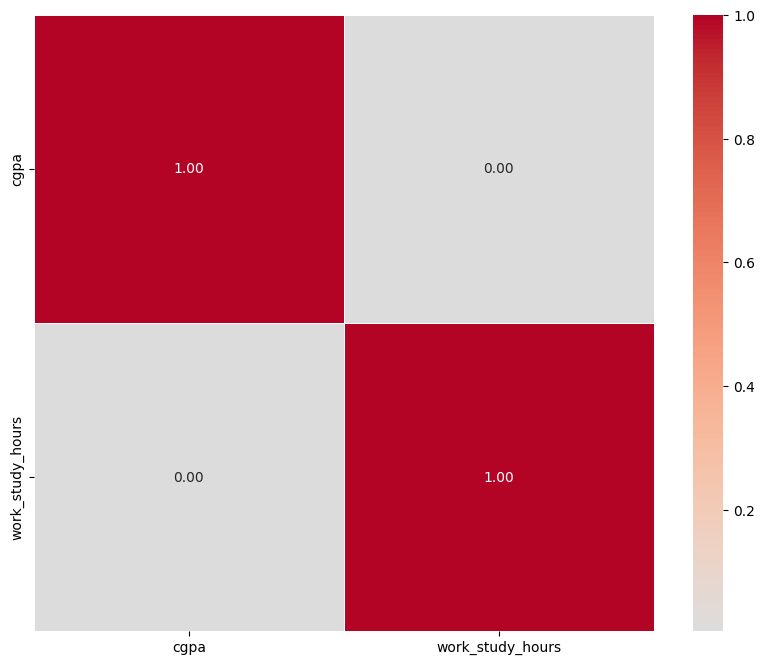

In [0]:

# Configuração do gráfico
plt.figure(figsize=(10,8))
sns.heatmap(
    corr_data.corr(), 
    annot=True, 
    cmap='coolwarm', 
    center=0,
    fmt='.2f',  
    linewidths=0.5
)

# Converter variáveis categóricas se necessário
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
corr_data['gender'] = le.fit_transform(corr_data['gender'])

####Analise do gráfico: Matriz de Correlação (Heatmap)
Este mapa de calor representa as correlações entre todas as variáveis de seu conjunto de dados sobre depressão estudantil. Cada célula mostra o coeficiente de correlação entre duas variáveis, variando de -1 a 1. 

Cores vermelhas: Correlação positiva (valores próximos de +1)

Exemplo: Se pressão academica e pressão no trabalho têm correlação 0.8, significa que estudantes com alta pressão no trabalho tendem a ter alta pressão acadêmica

Cores azuis: Correlação negativa (valores próximos de -1)

Exemplo: Se duracao de sono e depressao têm correlação -0.6, significa que menos horas de sono estão associadas a maior depressão

Cores próximas ao branco: Pouca ou nenhuma correlação (valores próximos de 0)

Pontos importantes a analisar:
Correlações fortes (acima de 0.7 ou abaixo de -0.7) entre:

- Fatores de estresse (trabalho/estudo)
- Sono e saúde mental
- Histórico familiar e depressão
- Relações moderadas (entre 0.4-0.7 ou -0.4 a -0.7) que podem indicar:
- Impacto da satisfação com estudos/trabalho na depressão
- Relação entre hábitos alimentares e outros fatores

/databricks/python/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


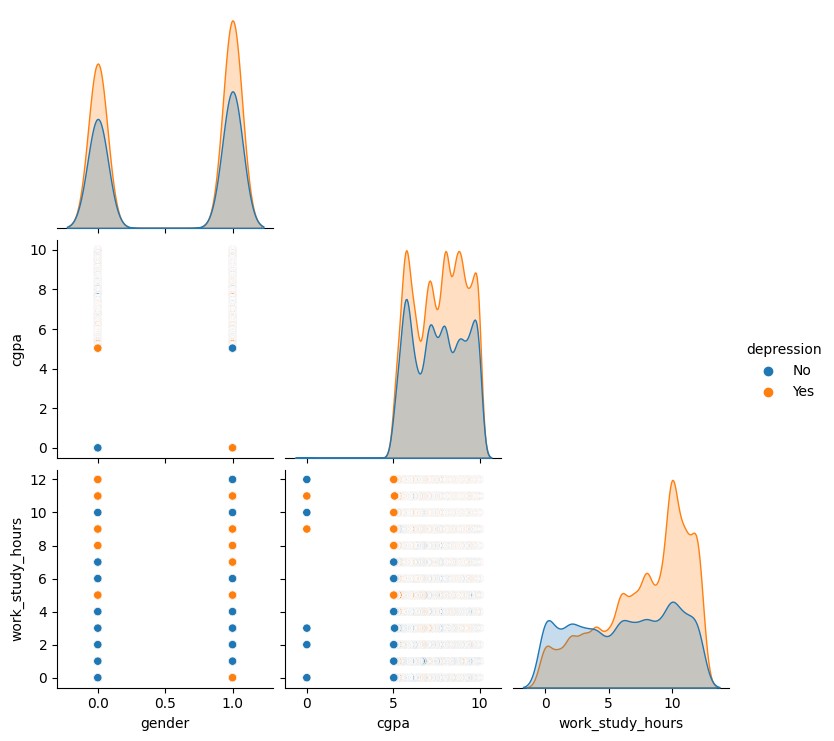

In [0]:
# Pairplot para relações bivariadas
sns.pairplot(corr_data, hue='depression', corner=True)
plt.show()

####Analise do gráfico: Pairplot (Gráfico de Pares)
Esta matriz de gráficos mostra relações entre várias variáveis, com pontos coloridos pelo nível de depressão.

Cores: Diferentes níveis de depressão (provavelmente categorizados)

Como interpretar: Nos gráficos de dispersão:

Padrões ascendentes: Correlação positiva

Padrões descendentes: Correlação negativa

Nuvens sem padrão: Pouca correlação

Nos histogramas:

Distribuição dos valores para cada variável

Como os diferentes níveis de depressão se distribuem

Insights potenciais:
Grupos de pontos coloridos (por depressão) que se separam claramente em certos pares de variáveis

Variáveis onde a distribuição muda significativamente entre níveis de depressão

Variáveis Chave no Seu Conjunto de Dados:
Esse dataset possui fatores importantes para análise de saúde mental:

- Demográficos: gênero, cidade, profissão, idade
- Acadêmicos: CGPA, pressão acadêmica, satisfação com estudos
- Profissionais: pressão no trabalho, satisfação no trabalho
- Saúde: hábitos alimentares, duração do sono
- Mental: depressão, histórico familiar, pensamentos suicidas


> # Auto Avaliação

Esse projeto demonstrou alguns pontos fracos que no cotidiano não identificava. Para descrever um pouco sobre o tema, decidi dividir a avaliação em pontos a analisar.

1. Planejamento e Definição do Problema
- O problema foi bem definido e alinhado aos objetivos do projeto pensados no inicio da análise
- A coleta de dados foi realmente eficiente e adequada para responder às perguntas levantadas. Senti falta no final do projeto da informação do período para destacar o projeto no tempo.

2. Manipulação e Análise dos Dados
- Usei técnicas apropriadas para limpeza e pré-processamento dos dados, as quais percebi durante uma busca não só no material da PUC-Rio, qto na busca por informação na internet.
- Escolhi modelos e algoritmos adequados que entendo que estão no contexto do problema.
- Os insights gerados agregaram valor ao projeto

3. Comunicação dos Resultados
- Os resultados foram apresentados de maneira clara e acessível ao público-alvo
- Os gráficos e visualizações ajudaram na interpretação dos dados, porém acredito que com um pouco mais tempo, poderia melhorar/alterar os gráficos.

4. Desafios e Aprendizados
- Tenho 25 anos de TI, porém essa parte de engenharia de dados, realmente não tenho experiência. Principal desafio realmente foi no entendimento do material e softwares que são utilizados no engenharia de dados.
- Aprendi a analisar melhor do dados, e todas as ferramentas envolvidas no projeto.

5. Melhorias e Próximos Passos
- Acredito que posso caprichar mais na apresentação dos projetos, melhorar nas definições do projeto.


Essa reflexão não só ajuda a identificar oportunidades de crescimento, como também aprimora futuras abordagens. Como você avalia seu desempenho nesse projeto?
